## Requirements env + moduls

In [1]:
import pytesseract as tess
from PIL import Image
from glob import glob
import matplotlib.pyplot as plt
import numpy as np

import cv2 as cv

In [2]:
img_size = (224, 224, 3) 
bach_size = 128 
img_dir = r'/kaggle/input/birdies/images'
label_dir = r'/kaggle/input/birdies/labels'


In [3]:
def get_box(label_dir, img_size): 
    # оптимизировано для диапазона чисел не более 2^16
    with open(label_dir) as f: # открытие файлов в ириктории
        line=f.readline()    
    box_params = line.split() # разделяем числа по пробелу
    xc = np.float16(box_params[1]) * img_size[1] # центр картинки по x
    yc = np.float16(box_params[2]) * img_size[0]   # центр картинки по y 
    
    bw = np.float16(box_params[3]) * img_size[1] # ширина
    bh = np.float16(box_params[4]) * img_size[0] # высота

    # отрисовка линий ящика
    x_min = np.int16((xc - bw/2)) # отложим от центра половину ширины вправо и влево
    
    x_max = np.int16((xc + bw/2))
    y_min = np.int16((yc - bh/2)) # отложим от центра половину длины вправо и влево
    
    y_max = np.int16((yc + bh/2))
    
    return x_min, y_min, x_max, y_max

In [4]:
def get_box_2(label_dir): 
    # оптимизировано для диапазона чисел не более 2^16
    with open(label_dir) as f: # открытие файлов в ириктории
        line=f.readline()    
    box_params = line.split() # разделяем числа по пробелу
    xc = np.float16(box_params[1])  # центр картинки по x
    yc = np.float16(box_params[2])    # центр картинки по y 
    
    bw = np.float16(box_params[3])  # ширина
    bh = np.float16(box_params[4])  # высота


    
    return xc, yc, bw, bh

In [5]:

def drow(xmin, ymin, xmax, ymax, IMG):
    plt.figure(figsize=(10,10))
    cv.rectangle(IMG, (xmin, ymin), (xmax, ymax), (255,0,0), 6) # рисуем прямоугольник на картинки
    plt.imshow(IMG)
    
    plt.show()

In [12]:


img_size = (224, 224, 3) 
img = sorted(glob(r'/kaggle/input/birdies/images/*'))
label = sorted(glob(r'/kaggle/input/birdies/labels/*'))
images = img[:3]
label = label[:3]



In [14]:
label[0]

'/kaggle/input/birdies/labels/0001.txt'

In [ ]:
from tkinter import filedialog
#import pytesseract as tess
#tess.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
from PIL import Image
import pytesseract as tess
files=filedialog.askopenfilenames()
n=len(files)
text=[]
for i in range(0,n):
    img = Image.open(files[i])
    text.append(tess.image_to_string(img))
    file=open(f'text{i}.txt',"w+")
    file.write(text[i])

In [54]:
def box_generator(img, label, scale=5, img_size = (224, 224, 3) ):
    coordinates = [0]

    BG = np.random.randint(low=0,high=256,size=img_size[0]*scale*img_size[1]*scale*img_size[2], dtype=np.uint16)
    BG = BG.reshape(img_size[0]*scale,img_size[1]*scale,img_size[2])
    
    x_c = np.random.choice(range(np.int32(img_size[0]/2),np.int32(BG.shape[0]-img_size[0]/2)))
    y_c = np.random.choice(range(np.int32(img_size[1]/2),np.int32(BG.shape[1]-img_size[1]/2)))
    
    IMG = Image.open(img)
    IMG = IMG.resize((img_size[0],img_size[1]))
    IMG = np.asarray(IMG)
    
    xc, yc, bw, bh = get_box_2(label)
    x_min_img, x_max_img, y_min_img, y_max_img = x_c-int(img_size[0]/2), x_c+int(img_size[0]/2), y_c-int(img_size[1]/2), y_c+int(img_size[1]/2)
    xc, yc, bw, bh = ((x_min_img+x_max_img)/2+xc)/(img_size[0]*scale), ((y_min_img+y_max_img)/2+yc)/(img_size[1]*scale), bw/scale, bh/scale
    BG[y_min_img:y_max_img, x_min_img:x_max_img] = IMG
    coordinates.append(xc)
    coordinates.append(yc)
    coordinates.append(bw)
    coordinates.append(bh)

    return BG, coordinates


[0, 0.823539297921317, 0.6701320103236608, 0.13369140625, 0.17939453125]
847 997 649 850


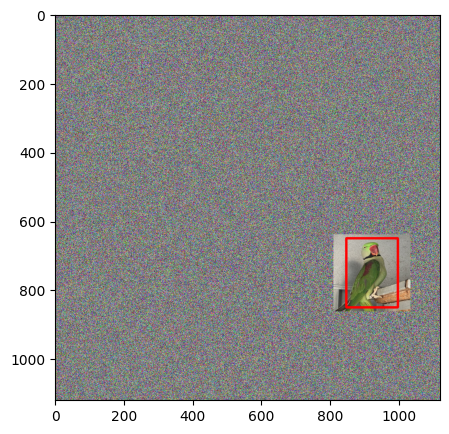

In [55]:
img, label = images[0], label[0]

BG, coordinates = box_generator(img, label, scale=5, img_size = (224, 224, 3) )
img_size = (224*5, 224*5, 3)
print(coordinates)
xc = np.float16(coordinates[1]) * img_size[1] # центр картинки по x
yc = np.float16(coordinates[2]) * img_size[0]   # центр картинки по y 
    
bw = np.float16(coordinates[3])* img_size[1] # ширина
bh = np.float16(coordinates[4])* img_size[0] # высота

    # отрисовка линий ящика
xmin = np.int16((xc - bw/2)) # отложим от центра половину ширины вправо и влево
xmax = np.int16((xc + bw/2))
ymin = np.int16((yc - bh/2)) # отложим от центра половину длины вправо и влево
ymax = np.int16((yc + bh/2))
print(xmin, xmax, ymin, ymax)
plt.figure(figsize=(5,5))
#cv.line(BG, (coordinates[1]-10, coordinates[2]-10),(coordinates[1]+10, coordinates[2]+10), (0,0,0),15)
#cv.circle(BG, (int(coordinates[1]), int(coordinates[2])), 5,(0,255,0), -1)

cv.rectangle(BG, (xmin, ymin), (xmax, ymax), (255,0,0), 6) # рисуем прямоугольник на картинки
plt.imshow(BG)
    
plt.show()

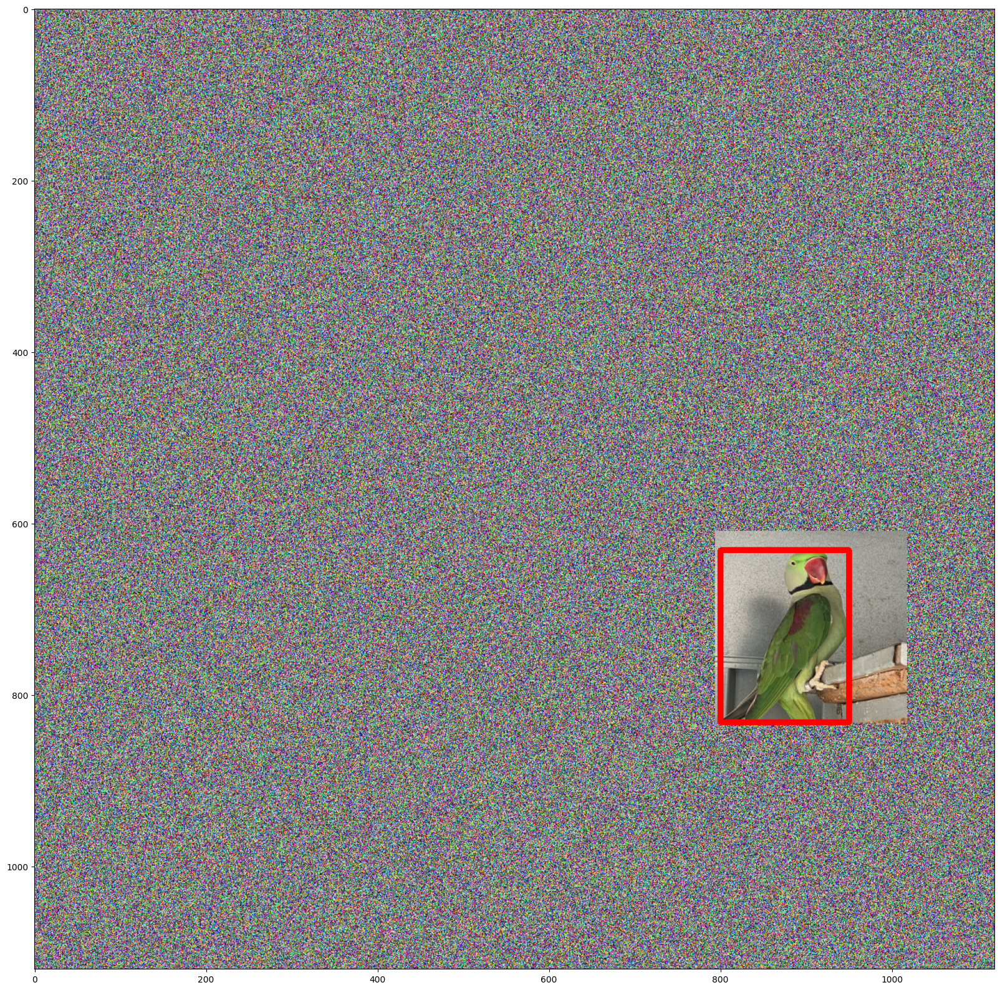

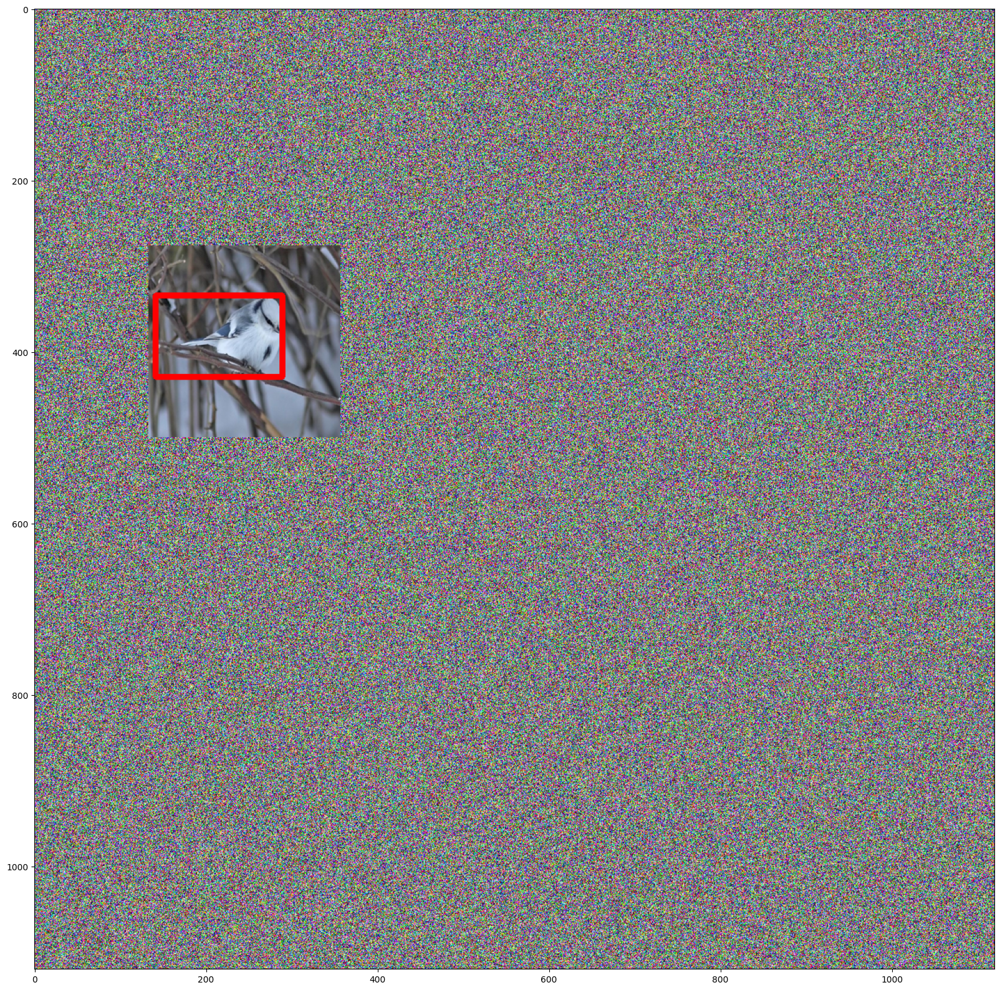

In [ ]:

#tqdm(files, total = len(files))

for i in tqdm(range(0,len(files), total = len(files)):
    BG = np.random.randint(low=0,high=256,size=img_size[0]*5*img_size[1]*5*img_size[2], dtype=np.uint16)
    BG = BG.reshape(img_size[0]*5,img_size[1]*5,img_size[2])
    x_c = np.random.choice(range(np.int32(img_size[0]/2),np.int32(BG.shape[0]-img_size[0]/2)))
    y_c = np.random.choice(range(np.int32(img_size[1]/2),np.int32(BG.shape[1]-img_size[1]/2)))
    IMG = Image.open(files[i])
    IMG = IMG.resize((img_size[0],img_size[1] ))
    IMG = np.asarray(IMG)
    
    x_min, y_min, x_max, y_max = get_box(label[i], IMG.shape)

   
    x_min_img, x_max_img, y_min_img, y_max_img = x_c-int(img_size[0]/2), x_c+int(img_size[0]/2), y_c-int(img_size[1]/2), y_c+int(img_size[1]/2)
    
    x_min, x_max, y_min, y_max = x_min_img+x_min, x_min_img+x_max, y_min_img+y_min, y_min_img+y_max
  
    #BG[x_min_img:x_max_img,y_min_img:y_max_img] = IMG

    BG[y_min_img:y_max_img, x_min_img:x_max_img] = IMG
    #print(x_min_img,x_max_img,y_min_img,y_max_img)
    #print(x_max, x_min, y_max,y_min)
    drow(x_min, y_min, x_max, y_max, BG)

    #plt.imshow(BG)
    plt.show()
    


In [ ]:



for i in range(0,len(files)):
    BG = np.random.randint(low=0,high=256,size=img_size[0]*5*img_size[1]*5*img_size[2], dtype=np.uint16)
    BG = BG.reshape(img_size[0]*5,img_size[1]*5,img_size[2])
    x_c = np.random.choice(range(int(img_size[0]/2),int(BG.shape[0]-img_size[0]/2)))
    y_c = np.random.choice(range(int(img_size[1]/2),int(BG.shape[1]-img_size[1]/2)))
    IMG = Image.open(files[i])
    IMG = IMG.resize((img_size[0],img_size[1] ))
    IMG = np.asarray(IMG)
    
    x_min, y_min, x_max, y_max = get_box(label[i], IMG.shape)
    #xc, yc, bw, bh = get_box_2(label[i])
    
    #print(x_max-x_min, y_max-y_min)

    #x_min, y_min, x_max, y_max = x_min/5, y_min/5, x_max/5, y_max/5
    x_min_img, x_max_img, y_min_img, y_max_img = x_c-int(img_size[0]/2), x_c+int(img_size[0]/2), y_c-int(img_size[1]/2), y_c+int(img_size[1]/2)
    #x_min, x_max, y_min, y_max = np.int32((x_min_img+x_min)/5), np.int32((x_max_img+x_max)/5), np.int32((y_min_img+y_min)/5), np.int32((y_max_img+y_max)/5)
    #x_min, x_max, y_min, y_max = np.int32(x_min_img+x_min/5), np.int32(x_max_img-x_max/5), np.int32(y_min_img+y_min/5), np.int32(y_max_img+y_max/5)
    #x_min, x_max, y_min, y_max = np.int32(x_min_img+x_min), np.int32(x_max_img+x_max), np.int32(y_min_img+y_min), np.int32(y_max_img+y_max)
    #x_min, x_max, y_min, y_max = xc*img_size[0]-bw*img_size[0]/2, xc*img_size[0]+bw*img_size[0]/2, yc*img_size[1]-bh*img_size[1]/2, yc*img_size[1]+bh*img_size[1]/2
    #x_min, x_max, y_min, y_max =  np.int64(x_min_img+x_min), np.int64(x_min_img+x_max) , np.int64(y_min_img+y_min), np.int64(y_min_img+y_max)
    #delta_x, delta_y = img_size[0]-
    #x_min, x_max, y_min, y_max = x_min_img+x_min, x_max_img+x_max, y_min_img+y_min, y_max_img+y_max
    #x_min, x_max, y_min, y_max = (x_min_img+x_min)/5, (x_max_img+x_max)/5, (y_min_img+y_min)/5, (y_max_img+y_max)/5
    #x_min, x_max, y_min, y_max = x_min_img-x_min, x_max_img-x_max, y_min_img-y_min, y_max_img-y_max
    #x_min, x_max, y_min, y_max = x_min_img+5*x_min, x_max_img+5*x_max, y_min_img+5*y_min, y_max_img+5*y_max
    #x_min, x_max, y_min, y_max = 5*x_min_img+x_min, 5*x_max_img+x_max, 5*y_min_img+y_min, 5*y_max_img+y_max

    #x_min, x_max, y_min, y_max =  y_min_img+y_min, y_min_img+y_max, x_min_img+x_min, x_min_img+x_max
    #x_min, x_max, y_min, y_max = y_min, y_max, x_min, x_max, 
    #x_min, x_max, y_min, y_max = x_min_img+x_min, x_min_img+x_max, y_min_img+y_min, y_min_img+y_max
    x_min, x_max, y_min, y_max = y_min_img+x_min, y_min_img+x_max, x_min_img+y_min, x_min_img+y_max
    #print(a.shape, BG.shape, x_c-int(img_size[0]/2),x_c+int(img_size[0]/2),y_c-int(img_size[1]/2),y_c+int(img_size[1]/2) )
    BG[x_min_img:x_max_img,y_min_img:y_max_img] = IMG
    print(x_min_img,x_max_img,y_min_img,y_max_img)
    print(x_max, x_min, y_max,y_min)
    drow(x_min, y_min, x_max, y_max, BG, )
    #drow(x_min, y_min, x_max, y_max, BG, )
    #plt.imshow(BG)
    plt.show()
    


715 939 44 268
200 50 938 737


In [ ]:
from PIL import Image
import numpy as np
from glob import glob
import matplotlib.pyplot as plt
import cv2 as cv
img_size = (224, 224, 3) 
data=np.random.randint(low=64,high=128,size=img_size[0]*5*img_size[1]*5*img_size[2], dtype=np.uint16)
data = data.reshape(img_size[0]*5,img_size[1]*5,img_size[2])




#Image.fromarray(data[:,:,:],'RGB').save("output.png")

In [ ]:
BG = np.random.randint(low=0,high=256,size=img_size[0]*5*img_size[1]*5*img_size[2], dtype=np.uint16)
BG = BG.reshape(img_size[0]*5,img_size[1]*5,img_size[2])
x_c = np.random.choice(range(int(BG.shape[0]-img_size[0]/2-5)))


In [ ]:
range(int(BG.shape[0]-img_size[0]/2-2))